Before you turn this problem in, make sure everything runs as expected. First, **restart the kernel** (in the menubar, select Kernel$\rightarrow$Restart) and then **run all cells** (in the menubar, select Cell$\rightarrow$Run All).

Make sure you fill in any place that says `YOUR CODE HERE` or "YOUR ANSWER HERE", as well as your name and collaborators below:

In [42]:
NAME = "chiehjul"
COLLABORATORS = "Pranay Reddy Dava, Jimmy Zhou"

### PLACE ALL YOUR CODE ABOVE THIS CELL. YOU CAN HAVE AS MANY CELLS AS NEEDED. BREAKDOWN THE CELLS INTO SMALL MEANINGFUL PIECES OF CODE 

# COVID-19 Pattern Analysis

Members:  Pranay Reddy Dava, Jimmy Zhou, Chieh Ju Lu

## Description:

The topic of our interest was analyzing the high-risk areas for Covid-19 in the USA and perhaps gaining insights or an explanation for why a high-risk area was classified as high risk. Our datasets were from open sources and Kaggle; there were many potential datasets, but we decided to select 4 datasets that had demographic information on U.S. states, confirmed cases in the U.S., the various counties in those 50 states, and the confirmed deaths. 


# 1. Basic function

Some basic function by Professor Mohammad Zia.

In [43]:
from IPython.display import display, HTML
import pandas as pd
import sqlite3
import re
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from sklearn.preprocessing import scale

from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
from sklearn.decomposition import PCA

from sqlite3 import Error

def create_connection(db_file, delete_db=True):
    import os
    if delete_db and os.path.exists(db_file):
        os.remove(db_file)

    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Error as e:
        print(e)

    return conn


def create_table(conn, create_table_sql):
    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)
        
def execute_sql_statement(sql_statement, conn):
    cur = conn.cursor()
    cur.execute(sql_statement)

    rows = cur.fetchall()

    return rows

### 1-1 Display csv files we will use

In [44]:
# Initial list
csv_list = []


In [45]:
#df = pd.read_csv('http://coronavirusapi.com/states.csv')
file = 'COVID19_state.csv'

csv_list.append(file)
df = pd.read_csv(file)

df.head()

,State,Tested,Infected,Deaths,Population,Pop Density,Gini,ICU Beds,Income,GDP,...,Hospitals,Health Spending,Pollution,Med-Large Airports,Temperature,Urban,Age 0-25,Age 26-54,Age 55+,School Closure Date
0,Alaska,28680,381,10,734002,1.2863,0.4081,119,59687,73205,...,21,11064,6.4,1.0,26.6,66.0,0.36,0.39,0.25,03/19/20
1,Alabama,129444,10164,403,4908621,96.9221,0.4847,1533,42334,45219,...,101,7281,8.1,1.0,62.8,59.0,0.33,0.37,0.31,03/16/20
2,Arkansas,70323,4043,94,3038999,58.4030,0.4719,732,42566,42454,...,88,7408,7.1,0.0,60.4,56.2,0.34,0.37,0.30,03/17/20
3,Arizona,150241,11380,542,7378494,64.9550,0.4713,1559,43650,48055,...,83,6452,9.7,1.0,60.3,89.8,0.33,0.36,0.30,03/16/20
4,California,991897,67939,2770,39937489,256.3727,0.4899,7338,62586,74205,...,359,7549,12.8,9.0,59.4,95.0,0.33,0.40,0.26,03/19/20


In [46]:
# USA fact county population (Keep updating)
#file = "https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_county_population_usafacts.csv"
file = "covid_county_population_usafacts.csv"

csv_list.append(file)
df = pd.read_csv(file)

df.head()

,countyFIPS,County Name,State,population
0,0,Statewide Unallocated,AL,0
1,1001,Autauga County,AL,55869
2,1003,Baldwin County,AL,223234
3,1005,Barbour County,AL,24686
4,1007,Bibb County,AL,22394


In [47]:
# USA fact county confirmed case (Keep updating)
#file = 'https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_confirmed_usafacts.csv'
file = 'covid_confirmed_usafacts.csv'


csv_list.append(file)
df = pd.read_csv(file)

df.head()

,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,45,48,53,53,58,61,67,68,74,84
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,181,187,188,189,196,205,208,216,222,224
3,1005,Barbour County,AL,1,0,0,0,0,0,0,...,43,45,45,47,47,51,53,58,59,61
4,1007,Bibb County,AL,1,0,0,0,0,0,0,...,42,42,42,43,43,44,44,45,46,46


In [48]:
# USA fact county deaths case (Keep updating)
#file = 'https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_deaths_usafacts.csv'
file = 'covid_deaths_usafacts.csv'

csv_list.append(file)
df = pd.read_csv(file)

df.head()

,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,3,3,3,3,3,3,4,4,4,4
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,4,4,4,5,5,5,5,5,5,6
3,1005,Barbour County,AL,1,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
4,1007,Bibb County,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,1,1


### 1-2. Generate table and DB automatically

In [49]:
# Get column name from dataframe and return list
def get_col_name_from_dataframe(df):
    col_list = []
    
    return list(df.columns)


In [50]:
def get_col_name_from_db(table_name, conn):
    
    sql_statement = "select * from "
    sql_statement = sql_statement + table_name + ';'
    df = pd.read_sql_query(sql_statement, conn)
    
    return list(df.columns)

In [51]:
# Automatically return sql create table statement
# Output: [table_name, sql_statement]
import os

def sql_create_table_statement(df, file):
    
    # Init 
    sql_statement = ""
    
    # Get table name from the file name
    base_name = os.path.basename(file)
    table_name = os.path.splitext(base_name)[0]
    
    sql_statement = "CREATE TABLE IF NOT EXISTS [" + table_name + """] (
    [PK]  INTEGER  NOT NULL PRIMARY KEY""" 
    
    
    for col in list(df.columns.values):
        col_pd_type = str(df[col].dtypes)
        col_type = ""
        
        try:
            if col_pd_type == None:
                continue
            elif col_pd_type == "float64":
                col_type = "FLOAT"
            elif col_pd_type == "int64":
                col_type = "INTEGER"
            else:
                col_type = "TEXT"
        except:
            col_type = "TEXT"
            
        sql_statement = sql_statement + ",\n    [" + col + "] " + col_type + " NULL"
    sql_statement = sql_statement + "\n); "
    return ([table_name, sql_statement])

#for csv in csv_list:    
#    df = pd.read_csv(csv)
#    table_info = sql_create_table_statement(df, csv)
#    print(table_info[0])
#    print(table_info[1])


Create connection (If exists, removing db) and table

In [52]:
conn = create_connection('COVID19.db')

with conn:
    for csv in csv_list:
        #Init
        sql_insert_statement = ""
        col_list = []
        
        df = pd.read_csv(csv)
        
        # Create table
        table_info = sql_create_table_statement(df, csv)
        create_table(conn, table_info[1])
        
        # Insert data to table
        col_list = get_col_name_from_dataframe(df)
        sql_insert_statement = "INSERT INTO " + table_info[0] + "('PK', '"+ "', '".join(col_list) +"')\n VALUES(?"
        sql_insert_statement = sql_insert_statement + ", ?"*(len(col_list)) + " )"
        cur = conn.cursor()
                
        for pk, row in zip(list(df.index.values),df.values.tolist()):
            row.insert(0, int(pk))
            
            cur.execute(sql_insert_statement, row)
            
            

Test if the table is stored in db successfully

In [53]:
sql_statement = "select * from covid_confirmed_usafacts;"
df = pd.read_sql_query(sql_statement, conn)

display(df.head())

,PK,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20
0,0,0,Statewide Unallocated,AL,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,1001,Autauga County,AL,1,0,0,0,0,0,...,45,48,53,53,58,61,67,68,74,84
2,2,1003,Baldwin County,AL,1,0,0,0,0,0,...,181,187,188,189,196,205,208,216,222,224
3,3,1005,Barbour County,AL,1,0,0,0,0,0,...,43,45,45,47,47,51,53,58,59,61
4,4,1007,Bibb County,AL,1,0,0,0,0,0,...,42,42,42,43,43,44,44,45,46,46


## 2. Analysis

### 2-1. Analyze the distribution of COVID-19 in the US

**2-1-1. Spread of Covid19 in the US**

 (Note: If you don't have plotly in jupyter, please use: 'conda install -c https://conda.anaconda.org/plotly plotly' to install.)

In [54]:
import json
from datetime import datetime, timedelta

from urllib.request import urlopen
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
import plotly
import plotly.express as px

In [55]:
#Init
sql_county_case = ""

sql_county_case = "select covid_confirmed_usafacts.countyFIPS "

sql_county_case = """select covid_confirmed_usafacts.countyFIPS , covid_confirmed_usafacts.\"""" + get_col_name_from_db('covid_confirmed_usafacts', conn)[-1]  
sql_county_case = sql_county_case + """\" *1.0/ covid_county_population_usafacts.population as percentage from covid_confirmed_usafacts
LEFT OUTER JOIN covid_county_population_usafacts ON covid_county_population_usafacts.PK = covid_confirmed_usafacts.PK ;"""

df_county_case = pd.read_sql_query(sql_county_case, conn)
df_county_case = df_county_case.set_index("countyFIPS")


In [56]:
#Init
county_fips_list = []

for county_fips in list(df_county_case.index.values):
    county_fips_list.append(str(str(county_fips).zfill(5)))


In [57]:
fig = px.choropleth(df_county_case, geojson=counties, locations=county_fips_list, color='percentage',
                    color_continuous_scale="Reds",
                    range_color=(0, 0.020),
                    labels={'percentage':'% infection'},
                    scope="usa"                          
                   )

fig.update_layout(
    margin={"r":20,"t":60,"l":20,"b":20}, 
    legend_title = '% infection',
    title_text = 'COVID-19 infection rate by county'
)

fig.show()

**2-1-2 Increasing trends in each state:**

We want to understand the different trends in different regions through the increasing number of infected people in each state.

**2-1-2-1. Top 15 highest number of confirmed cases by states**

In [58]:
#Init
sql_state_rank_inc = ""

sql_state_rank_inc = "select State "

for col in get_col_name_from_db('covid_confirmed_usafacts', conn):
    if re.match(r'[1-9]+.*',col):
        sql_state_rank_inc = sql_state_rank_inc + ", sum(\"" + col + "\") as \"" + col + "\""
sql_state_rank_inc = sql_state_rank_inc + " from covid_confirmed_usafacts group by State;"


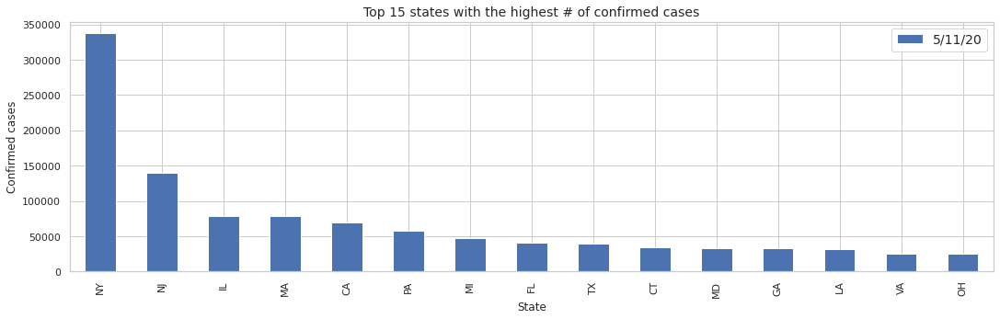

In [59]:

df = pd.read_sql_query(sql_state_rank_inc, conn)

rank_inc = df.sort_values(list(df.columns)[-1], ascending=False).head(15)


rank_inc = rank_inc[['State',list(df.columns)[-1]]]
rank_inc = rank_inc.set_index('State')

rank_plot = rank_inc.plot(kind='bar',figsize=(18,5), title = "Top 15 states with the highest # of confirmed cases");
rank_plot.set_xlabel("State");
rank_plot.title.set_size(14);
rank_plot.set_ylabel("Confirmed cases");
rank_plot.legend(prop={'size': 14});


**2-1-2-2. Monthly # of confirmed cases in top 15 states**

In [60]:
#Init
sql_state_rank_inc = ""

sql_state_rank_inc = "select State "

for col in get_col_name_from_db('covid_confirmed_usafacts', conn):
    if re.match(r'[1-9]+.*',col):
        sql_state_rank_inc = sql_state_rank_inc + ", sum(\"" + col + "\") as \"" + col + "\""
sql_state_rank_inc = sql_state_rank_inc + " from covid_confirmed_usafacts group by State;"

df = pd.read_sql_query(sql_state_rank_inc, conn)

mon_inc = df.sort_values(list(df.columns)[-1], ascending=False).head(15)

mon_inc = mon_inc.set_index('State').transpose()
#mon_inc.index = pd.to_datetime(mon_inc.index)

# Init
last_data_each_month = []

pre_mon = '1'
data_mon_list = list(mon_inc.index.values)
for last_data_mon_index in range(len(data_mon_list)):
    mon = data_mon_list[last_data_mon_index].split('/')[0]
    if pre_mon != mon:
        last_data_each_month.append(data_mon_list[last_data_mon_index-1])
        pre_mon = mon
last_data_each_month.append(list(df.columns)[-1])

mon_inc = mon_inc.loc[last_data_each_month]
display(mon_inc)

State,NY,NJ,IL,MA,CA,PA,MI,FL,TX,CT,MD,GA,LA,VA,OH
1/31/20,0,0,2,0,4,0,0,0,0,0,0,0,0,0,0
2/29/20,0,0,2,1,22,0,0,0,0,0,0,0,0,0,0
3/31/20,74447,18696,5993,6620,8815,4839,7613,6741,3604,3128,1660,4110,5235,1250,2197
4/30/20,304441,119282,52908,62177,50322,45759,41367,33690,27991,27700,21742,25832,27998,15852,18018
5/11/20,337124,139945,79007,78462,69340,57154,47552,40982,39869,33765,33373,33308,31815,25074,24777


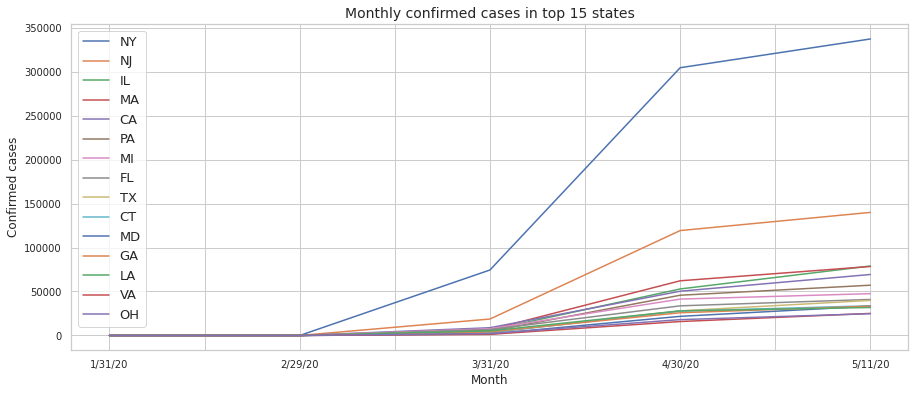

In [61]:
mon_plot = mon_inc.plot(kind='line',
                        figsize=(15,6), 
                        fontsize = 10,
                        title = "Monthly confirmed cases in top 15 states")
mon_plot.set_xlabel("Month");
mon_plot.title.set_size(14);
mon_plot.set_ylabel("Confirmed cases");
mon_plot.legend(prop={'size': 13});

We can observe that there are huge gaps in increasing rate with these 15 states.

### 2-2. Analyze why some states have a higher number of COVID-19 cases than others

**2-2-1. Find high correlation factors with COVID-19 infection**

For understanding the difference of the number of infection cases by state, we use the COVID19_state table to find the high correlated factors.

**2-2-1-1. Calculate the infection rate of population in each state**

Because the number of cases varies greatly from state to state, we use the percentage of population infection for analysis, the following table is the top 10 highest infection rate by states.

In [62]:
sql_statement = """select State, (Infected * 1.0/Population) as "Percentage of infection" from COVID19_state order by "Percentage of infection" DESC;"""
df = pd.read_sql_query(sql_statement, conn)


display(df.head(10).set_index('State').transpose())

State,Vermont,New York,New Jersey,Utah,Massachusetts,Connecticut,District of Columbia,South Dakota,Louisiana,Delaware
Percentage of infection,0.039917,0.017338,0.01566,0.012147,0.011246,0.009476,0.008865,0.008629,0.006849,0.006679


**2-2-1-2. Show the highest and lowest 10 states of COVID-19 infection rate**

To present clearer, we plotted the percentage of the highest and lowest number of COVID-19 infection in the top 10.

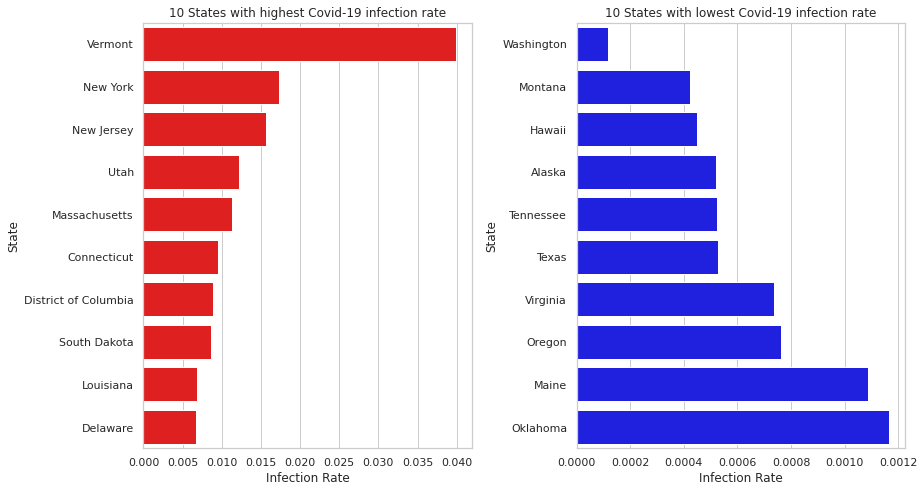

In [63]:
plt.figure(figsize=(13,7))

plt.subplot(1,2,1)

plot = sns.barplot(x='Percentage of infection', y='State',data=df.head(10), color="red")
plt.xlabel("Infection Rate")
plt.title("10 States with highest Covid-19 infection rate", size=12)


plt.subplot(1,2,2)

plot2 = sns.barplot(x='Percentage of infection', y='State',data=df.sort_values('Percentage of infection', ascending=True).head(10), color="blue")
plt.xlabel("Infection Rate")
plt.title("10 States with lowest Covid-19 infection rate", size=12)

plt.tight_layout()

**2-2-1-3. Correlation of different factors with the infection rate**

There are many states information in COVID19_state table, we calculate the correlation of each factor with infection rate, the following table is the ten highest correlated factors.

In [64]:
sql_statement = """select *, (Infected * 1.0/Population) as "Percentage of infection" from COVID19_state order by "Percentage of infection" DESC;"""
df = pd.read_sql_query(sql_statement, conn)

df = df.drop(columns=["PK"])
df = df.drop(columns=["Deaths"])
df = df.drop(columns=["Infected"])
df = df.drop(columns=["Tested"])

correlate = df.corr()[["Percentage of infection"]]
correlate = correlate.drop(index=["Percentage of infection"])

correlate = correlate.rename(columns={"Percentage of infection":"Correlation with infection rate"})

correlate.sort_values('Correlation with infection rate', ascending=False).head(10).transpose()

,Health Spending,Income,GDP,Pop Density,Age 55+,Gini,Physicians,Age 26-54,Urban,Population
Correlation with infection rate,0.378741,0.292758,0.188641,0.138078,0.136072,0.115568,0.050137,0.010239,-0.063329,-0.067237


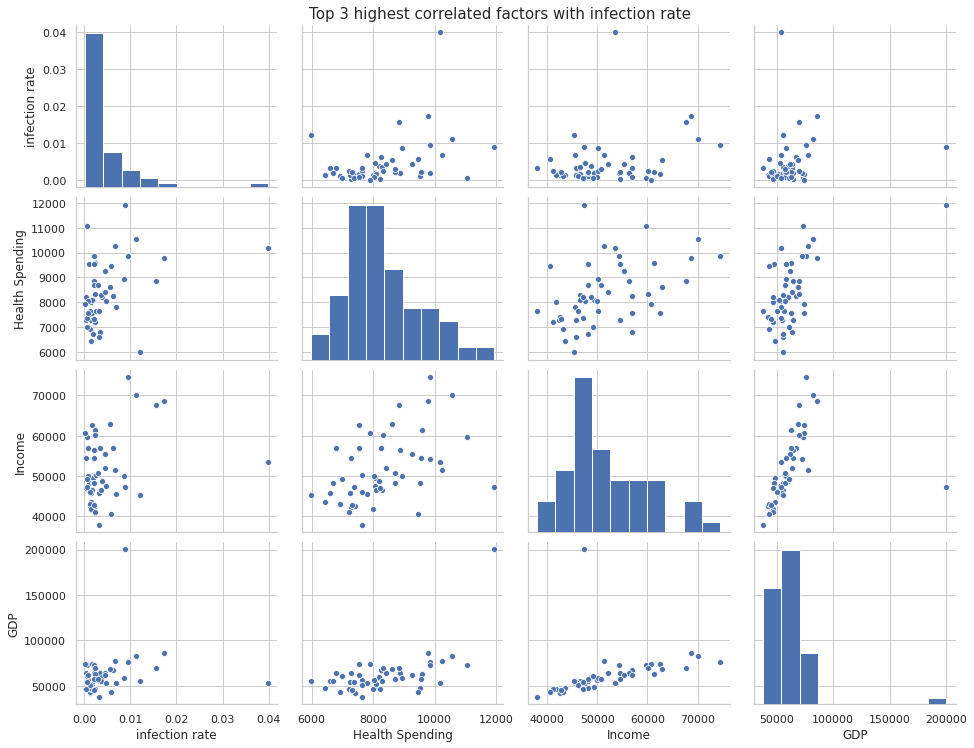

In [65]:
#Init
positive_cov = []
sql_stat_pairplot = ""

positive_cov = list(correlate.sort_values('Correlation with infection rate', ascending=False).head(3).transpose())

sql_stat_pairplot = "select (Infected * 1.0/Population) as \"infection rate\""
for col in positive_cov:
    sql_stat_pairplot = sql_stat_pairplot + ", \"" + col.strip('cov-') + "\""
sql_stat_pairplot = sql_stat_pairplot + " from COVID19_state;"

#print(sql_stat_pairplot)

df = pd.read_sql_query(sql_stat_pairplot, conn)

g = sns.pairplot(df, aspect=1.3);
g.fig.suptitle("Top 3 highest correlated factors with infection rate", y=1.02, fontsize = 15);

**2-2-2. Analyze factors that may influence infection rate.**

To observe the details of these factors, we use linear regression models to plot the relationship between infection rate and other factors that we consider may influence the rate of infection.

We divide these factors into three categories, medical resources, state development, and environmental factors.

**2-2-2-1. Medical resources**

Including health spending per capita, the number of hospitals, and the number of physicians by states.

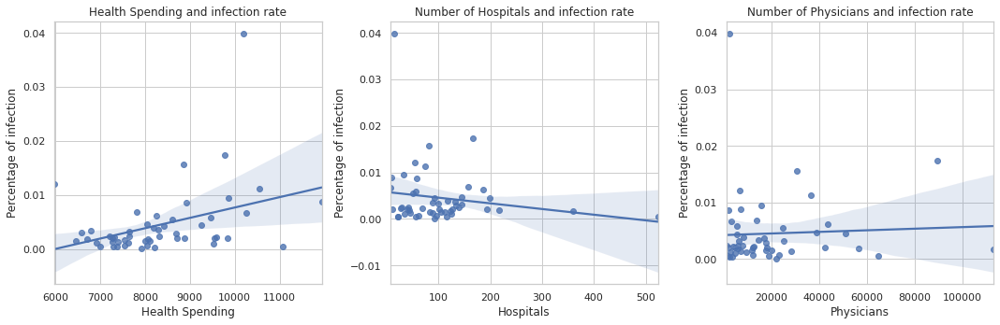

In [66]:
sql_statement = """select *, (Infected * 1.0/Population) as "Percentage of infection" from COVID19_state order by "Percentage of infection" DESC;"""
df = pd.read_sql_query(sql_statement, conn)

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)

plot = sns.regplot(x="Health Spending", y="Percentage of infection", data=df);
plt.title("Health Spending and infection rate", size=12)


plt.subplot(1,3,2)

plot2 = sns.regplot(x="Hospitals", y="Percentage of infection", data=df);
plt.title("Number of Hospitals and infection rate", size=12)

plt.tight_layout()

plt.subplot(1,3,3)

plot2 = sns.regplot(x="Physicians", y="Percentage of infection", data=df);
plt.title("Number of Physicians and infection rate", size=12)

plt.tight_layout()


**2-2-2-2. Development of each state**

Including population density, Gini (coefficient for income inequality), income (per capita), GDP, the number of medium-large airports, and urbans (percentage of the population living in an urban environment).

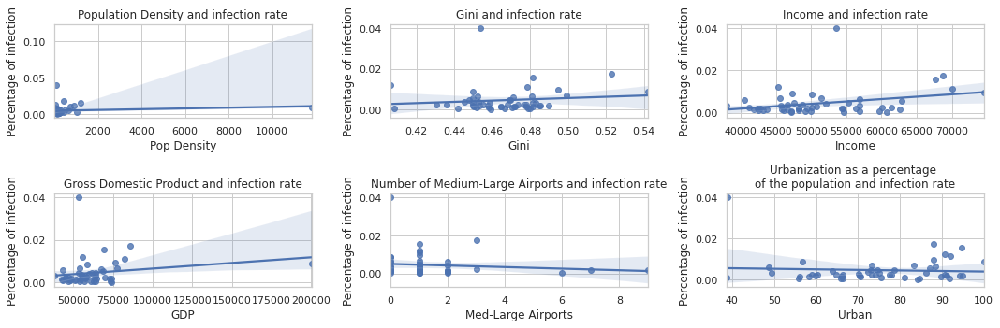

In [67]:
plt.figure(figsize=(15,5))

plt.subplot(2,3,1)

plot = sns.regplot(x="Pop Density", y="Percentage of infection", data=df);
plt.title("Population Density and infection rate", size=12)


plt.subplot(2,3,2)

plot2 = sns.regplot(x="Gini", y="Percentage of infection", data=df);
plt.title("Gini and infection rate", size=12)

plt.tight_layout()

plt.subplot(2,3,3)

plot2 = sns.regplot(x="Income", y="Percentage of infection", data=df);
plt.title("Income and infection rate", size=12)

plt.tight_layout()


plt.subplot(2,3,4)

plot2 = sns.regplot(x="GDP", y="Percentage of infection", data=df);
plt.title("Gross Domestic Product and infection rate", size=12)

plt.tight_layout()

plt.subplot(2,3,5)

plot2 = sns.regplot(x="Med-Large Airports", y="Percentage of infection", data=df,  label='small');
plt.title("Number of Medium-Large Airports and infection rate", size=12)

plt.tight_layout()

plt.subplot(2,3,6)

plot2 = sns.regplot(x="Urban", y="Percentage of infection", data=df);
plt.title("Urbanization as a percentage \nof the population and infection rate", size=12)

plt.tight_layout()

**2-2-2-3. Environmental factors**

Including pollution and temperature (Average temperature in 2019).

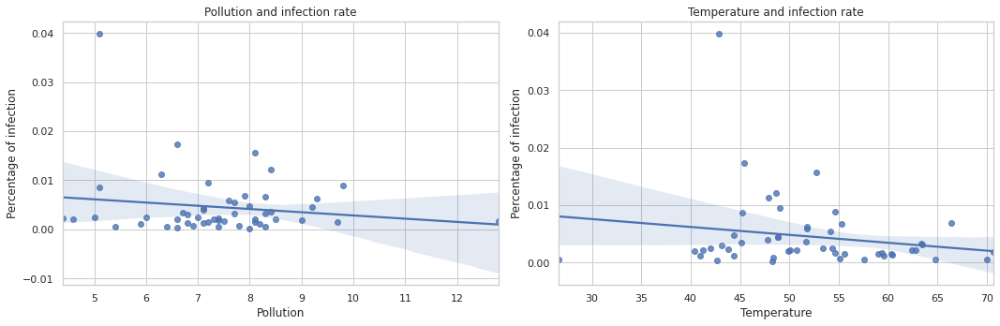

In [68]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)

plot = sns.regplot(x="Pollution", y="Percentage of infection", data=df);
plt.title("Pollution and infection rate", size=12)


plt.subplot(1,2,2)

plot2 = sns.regplot(x="Temperature", y="Percentage of infection", data=df);
plt.title("Temperature and infection rate", size=12)

plt.tight_layout()


**2-2-3 The effect of combining multiple factors with the percentage of COVID-19 infection**

We observed that the state's development and medical resources are more related to the proportion of infected than environmental factors, so we chose to do the analysis of the most relevant factors "Health Spending" and "Income" with infection rates. 

People with high incomes may have more resources to do COVID-19 tests, causing a higher infection rate. In order to know whether our guess is correct, we do the following steps to fit the data into the linear regression model:
1. Check if the number of COVID-19 tests is correlation with the infection rate.

2. Calculate the average income of all states and divide each state income per capita into two parts that are greater and lower than the state average. 

3. Use a linear regression model on “faceted” plots to explore interactions with three additional categorical variables, which are the number of COVID-19 tests with 10 states highest infection rates, "Health Spending" and "Income".

**2-2-3-1. Using linear regression model to plot of two variables with bivariate and univariate graphs.**

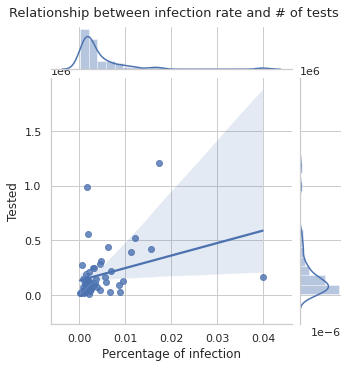

In [69]:
g = sns.jointplot(x="Percentage of infection", 
                     y="Tested", 
                     data=df, 
                     kind="reg", 
                     height = 5, 
                     );
g.fig.suptitle("Relationship between infection rate and # of tests", y=1.02, fontsize = 13);

**2-2-3-2. Use a linear regression model on “faceted” plots to explore interactions in "Tests", "Income", and "Health spending".**

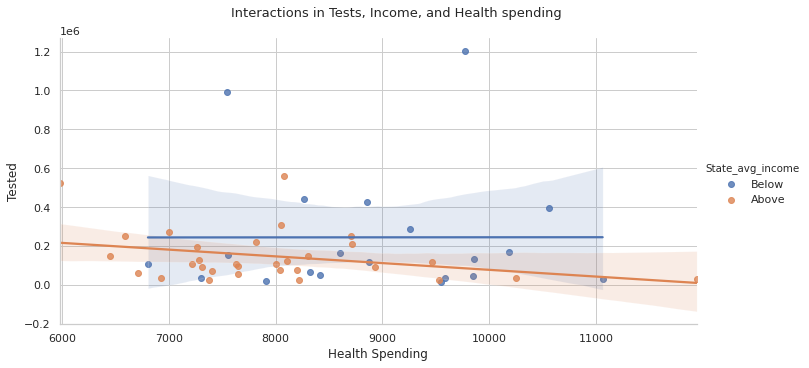

In [70]:
# Step 1. Seperate income to above avg and below avg
df2 = df.assign(State_avg_income=df["Income"] < df["Income"].mean())

df2.loc[df2["State_avg_income"] == True, 'State_avg_income'] = 'Above'  
df2.loc[df2["State_avg_income"] == False, 'State_avg_income'] = 'Below'  

# Step 2. Use regression model to plot.
g2 = sns.lmplot(x="Health Spending", y="Tested", hue="State_avg_income", data=df2, height=5, aspect = 2.0);
g2.fig.suptitle("Interactions in Tests, Income, and Health spending", y=1.02, fontsize = 13);

### 2-3. Analyze why some states have a higher COVID-19 mortality rate than others

In the 2-2 analysis, we found that the difference in infection rate in each state is most related to personal income because people with higher-than-average income have more medical resources to do more COVID-19 tests. Under this premise, we think that this information is not enough for us to understand COVID-19, because it is possible that there are more people infected with COVID-19.

In order to deeper analyze COVID-19, we believe that the analysis of COVID-19 mortality rate can provide more information about COVID-19 than the infection rate. We decided to focus on why the mortality rate in some states will be higher than in other states, and who are a high-risk at COVID-19.

**2-3-1. Find high correlation factors with COVID-19 death**

**2-3-1-1. Mortality rate of COVID-19 infected people by states**

First, we calculate the mortality rate of COVID-19 infection by states and find the 10 states with the highest mortality rates.

In [71]:
sql_statement = "select State, round((Deaths*1.0/Infected),3) as \"mortality rate\" from COVID19_state order by \"mortality rate\" DESC;"
df = pd.read_sql_query(sql_statement, conn)

display(df.head(11).set_index('State').transpose())



State,Michigan,Connecticut,Louisiana,New Jersey,Massachusetts,Pennsylvania,New York,Oklahoma,Indiana,Washington,Ohio
mortality rate,0.096,0.089,0.07,0.067,0.065,0.065,0.064,0.059,0.057,0.057,0.055


**2-2-1-2. Show the highest and lowest 10 states of COVID-19 motality rate**

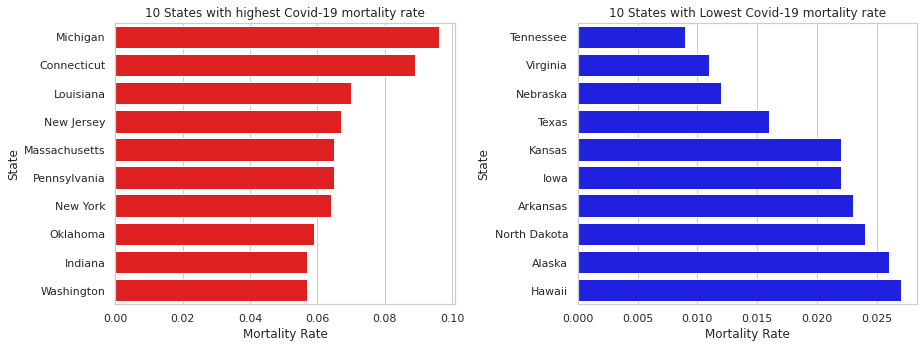

In [72]:
plt.figure(figsize=(13,5))

plt.subplot(1,2,1)

plot = sns.barplot(x='mortality rate', y='State',data=df.head(10), color="red")
plt.xlabel("Mortality Rate")
plt.title("10 States with highest Covid-19 mortality rate", size=12)


plt.subplot(1,2,2)

plot2 = sns.barplot(x='mortality rate', y='State',data=df.sort_values('mortality rate', ascending=True).head(10), color="blue")
plt.xlabel("Mortality Rate")
plt.title("10 States with Lowest Covid-19 mortality rate", size=12)

plt.tight_layout()

**2-3-1-3. Correlation of different factors with mortality rate**

In [84]:
sql_statement = "select *, round((Deaths*1.0/Infected),3) as \"mortality rate\" from COVID19_state order by \"mortality rate\" DESC;"

df = pd.read_sql_query(sql_statement, conn)

df = df.drop(columns=["PK"])
df = df.drop(columns=["Deaths"])
df = df.drop(columns=["Tested"])

correlate = df.corr()[["mortality rate"]]
correlate = correlate.drop(index=["mortality rate"])

correlate = correlate.rename(columns={"mortality rate":"Correlation with mortality rate"})

correlate.sort_values('Correlation with mortality rate', ascending=False).head(10).transpose()

,Infected,Gini,Income,Unemployment,Urban,Physicians,Health Spending,Pollution,Age 55+,Age 26-54
Correlation with mortality rate,0.36088,0.342694,0.305235,0.277931,0.262585,0.232662,0.229218,0.19924,0.1639,0.149854


We noticed that the number of infections of COVID-19 had the highest correlation with mortality rate, in order to get more accurate correlation, we converted the number of infections of COVID-19 to infection rate ( # of infection / population) and calculate correlation again.

In [85]:
sql_statement = "select *, (Infected * 1.0/Population) as \"Percentage of infection\", round((Deaths*1.0/Infected),3) as \"mortality rate\" from COVID19_state order by \"mortality rate\" DESC;"

df = pd.read_sql_query(sql_statement, conn)

df = df.drop(columns=["PK"])
df = df.drop(columns=["Deaths"])
df = df.drop(columns=["Infected"])
df = df.drop(columns=["Tested"])

correlate = df.corr()[["mortality rate"]]
correlate = correlate.drop(index=["mortality rate"])

correlate = correlate.rename(columns={"mortality rate":"Correlation with mortality rate"})

correlate.sort_values('Correlation with mortality rate', ascending=False).head(10).transpose()

,Gini,Income,Unemployment,Urban,Physicians,Health Spending,Pollution,Percentage of infection,Age 55+,Age 26-54
Correlation with mortality rate,0.342694,0.305235,0.277931,0.262585,0.232662,0.229218,0.19924,0.194802,0.1639,0.149854


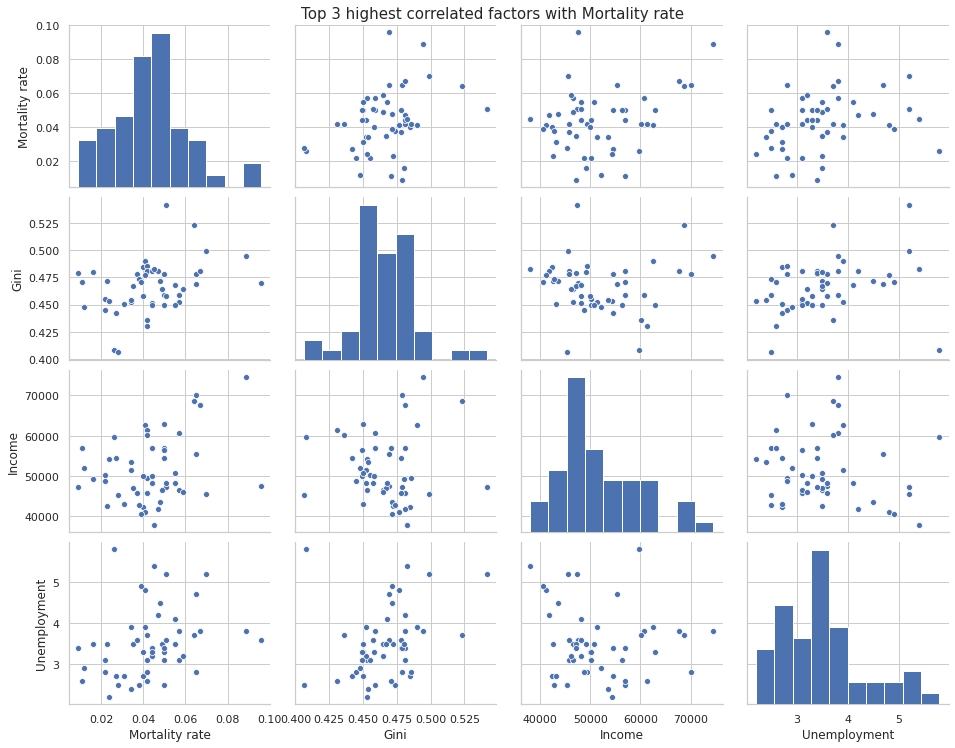

In [86]:
#Init
positive_cov = []
sql_stat_pairplot = ""

positive_cov = list(correlate.sort_values('Correlation with mortality rate', ascending=False).head(3).transpose())

sql_stat_pairplot = "select round((Deaths*1.0/Infected),3) as \"Mortality rate\""
for col in positive_cov:
    sql_stat_pairplot = sql_stat_pairplot + ", \"" + col.strip('cov-') + "\""
sql_stat_pairplot = sql_stat_pairplot + " from COVID19_state;"

#print(sql_stat_pairplot)

df = pd.read_sql_query(sql_stat_pairplot, conn)

g = sns.pairplot(df, aspect=1.3);
g.fig.suptitle("Top 3 highest correlated factors with Mortality rate", y=1.02, fontsize = 15);

**2-3-2. Analyze factors that may influence mortality rate.**

We found that some factors have high correlation with mortality rate are unreasonable. Both Gini coefficient for income inequality and unemployment rate can be intuitively judged to have a positive correlation with mortality rate, but income is also high related.

Therefore, we plot 10 factors with highest and lowest correlation ,then choose some factors that we are interested in for detailed analysis.

**2-3-2-1. Plot 10 factors with highest and lowest correlation with mortality rate.**

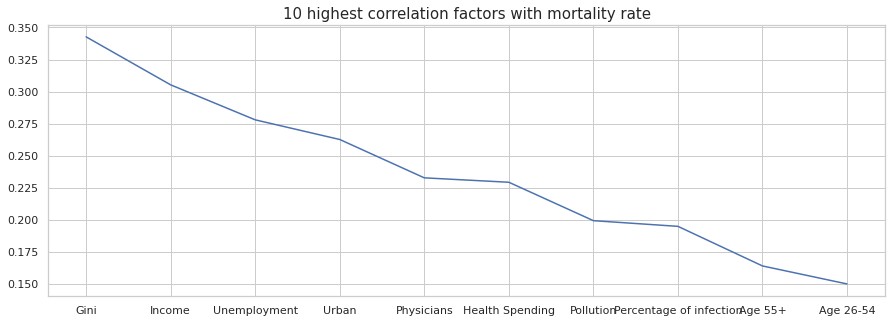

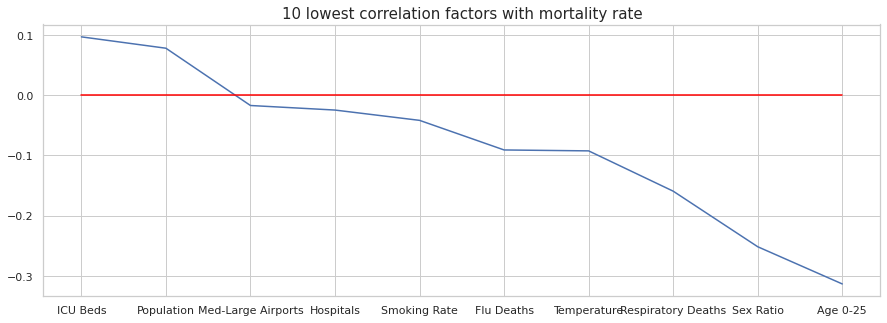

In [90]:
sql_statement = "select *, (Infected * 1.0/Population) as \"Percentage of infection\", round((Deaths*1.0/Infected),3) as \"mortality rate\" from COVID19_state order by \"mortality rate\" DESC;"

df = pd.read_sql_query(sql_statement, conn)

df = df.drop(columns=["PK"])
df = df.drop(columns=["Deaths"])
df = df.drop(columns=["Infected"])
df = df.drop(columns=["Tested"])

correlate = df.corr()[["mortality rate"]]
correlate = correlate.drop(index=["mortality rate"])

correlate = correlate.rename(columns={"mortality rate":"Correlation with mortality rate"})

correlate.sort_values('Correlation with mortality rate', ascending=False).head(10).transpose()

plt.figure(figsize=(15,5))
plt.plot(correlate.sort_values('Correlation with mortality rate', ascending=False).head(10));
plt.title("10 highest correlation factors with mortality rate", size=15);

plt.figure(figsize=(15,5))
plt.plot(correlate.sort_values('Correlation with mortality rate', ascending=False).tail(10));
plt.plot([0, 9], [0, 0], color='red');
plt.title("10 lowest correlation factors with mortality rate", size=15);


**2-3-2-2. Detailed analysis with highest correlated factors "Income" and "Gini".**

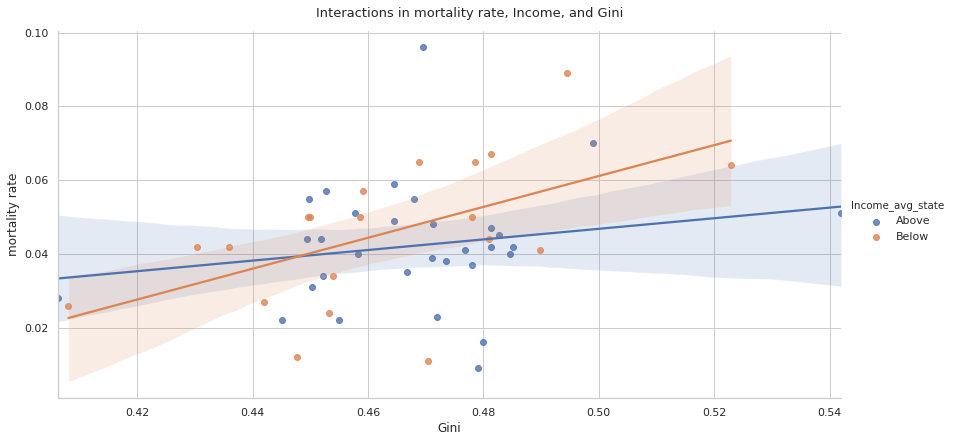

In [91]:
sql_statement = "select *, (Infected * 1.0/Population) as \"Percentage of infection\", round((Deaths*1.0/Infected),3) as \"mortality rate\" from COVID19_state order by \"mortality rate\" DESC;"
df = pd.read_sql_query(sql_statement, conn)

# Step 1. Seperate income to above avg and below avg
df2 = df.assign(Income_avg_state=df["Income"] < df["Income"].mean())

df2.loc[df2["Income_avg_state"] == True, 'Income_avg_state'] = 'Above'  
df2.loc[df2["Income_avg_state"] == False, 'Income_avg_state'] = 'Below'  

# Step 2. Use regression model to plot.
g2 = sns.lmplot(x="Gini", y="mortality rate", hue="Income_avg_state", data=df2, height=6, aspect = 2.0);
g2.fig.suptitle("Interactions in mortality rate, Income, and Gini", y=1.02, fontsize = 13);

**2-3-2-3. Detailed analysis with lowest correlated factors "Sex ratio" and  "Age".**

It is difficult to get a conclusion from the analysis results of the highest correlation (2-3-2-2), so we also select the factors with the highest negative correlation for analysis.

**Analyze the relationship between sex ratio, Smoking rate and mortality rate**

To get more convincing results, we add another factor "smoking rate". In this part, We plot data and use the regression model fits across a FacetGrid.

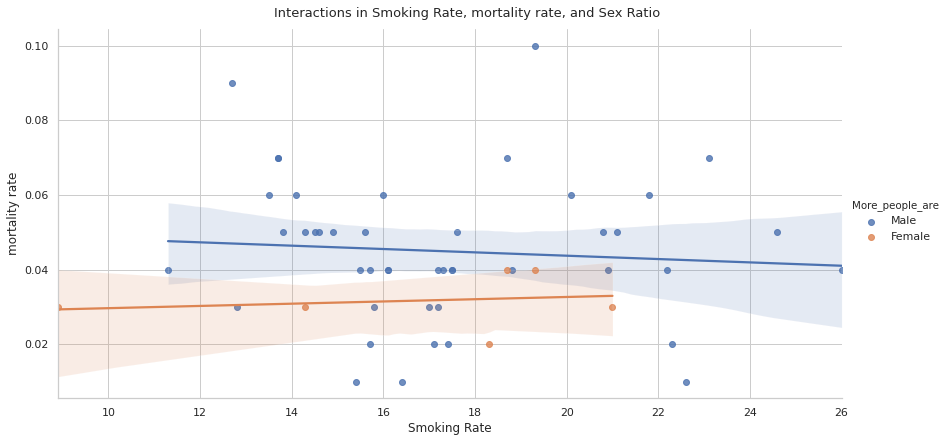

In [78]:
sql_statement = "select \"Sex Ratio\",\"Smoking Rate\", round((Deaths*1.0/Infected),2) as \"mortality rate\" from COVID19_state order by \"mortality rate\" DESC;"
df2 = pd.read_sql_query(sql_statement, conn)

df2 = df2.assign(More_people_are=df2["Sex Ratio"] < 1)
df2.loc[df2["More_people_are"] == True, 'More_people_are'] = 'Male'  
df2.loc[df2["More_people_are"] == False, 'More_people_are'] = 'Female'  

g2 = sns.lmplot(x="Smoking Rate", y="mortality rate", hue="More_people_are", data=df2, height=6, aspect = 2.0);
g2.fig.suptitle("Interactions in Smoking Rate, mortality rate, and Sex Ratio", y=1.02, fontsize = 13);


The sex ratio of each state does increase the risk of COVID-19 death. Moreover, even though the correlation of Smoking rate to COVID-19 mortality rate is close to zero, we can still observe that when there are more female in a state, the higher the smoking rate, the higher the mortality rate; when there are more male in a state, the smoking rate has merely no effect on the COVID-19 mortality rate.
We speculate that states with more male also have higher smoking rates, causing higher COVID-19 mortality.

**Analyze the relationship between age and mortality rate**

In the correlation table, we noticed that the age of 55+ has a positive correlation with the COVID-19 mortality rate, and the age of 0-25 has the highest negative correlation with it. We plotted the age percentage of the ten states with the highest mortality rate.

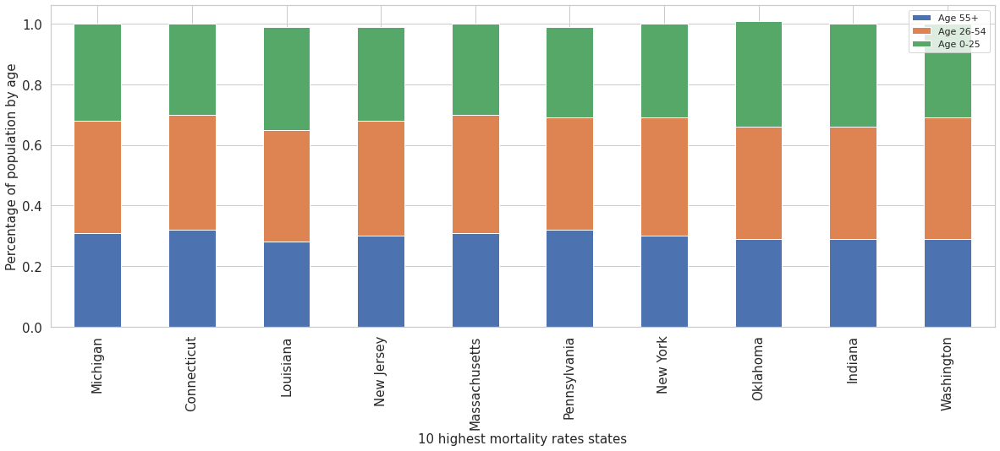

In [79]:
sns.set(style="whitegrid")

rs = np.random.RandomState(365)
values = rs.randn(365, 4).cumsum(axis=0)
dates = pd.date_range("1 1 2016", periods=365, freq="D")
data = pd.DataFrame(values, dates, columns=["A", "B", "C", "D"])
data = data.rolling(7).mean()

plot = df.head(10).plot.bar(x='State', y=['Age 55+', 'Age 26-54','Age 0-25'], 
                     stacked=True, 
                     figsize=(20,7), 
                     fontsize = 15);
plot.set_xlabel("10 highest mortality rates states", fontsize = 15);
plot.set_ylabel("Percentage of population by age", fontsize = 15);

## 2-4. Use other models to analyze infection data

By analyzing the factors that may affect the infection rate and mortality rate of COVID-19 in each state, we cannot reach a credible and clear conclusion. It is possible that there is a considerable correlation between each factor, and we cannot only observe the relationship between factors and the infection rate/mortality rate. 

**2-4-1. The correlation between all factors in heatmap**

In [102]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso
import seaborn as sns
from sklearn import preprocessing
sns.set(color_codes=True)
sns.set_style('whitegrid')
sns.set_context('paper',font_scale=2)

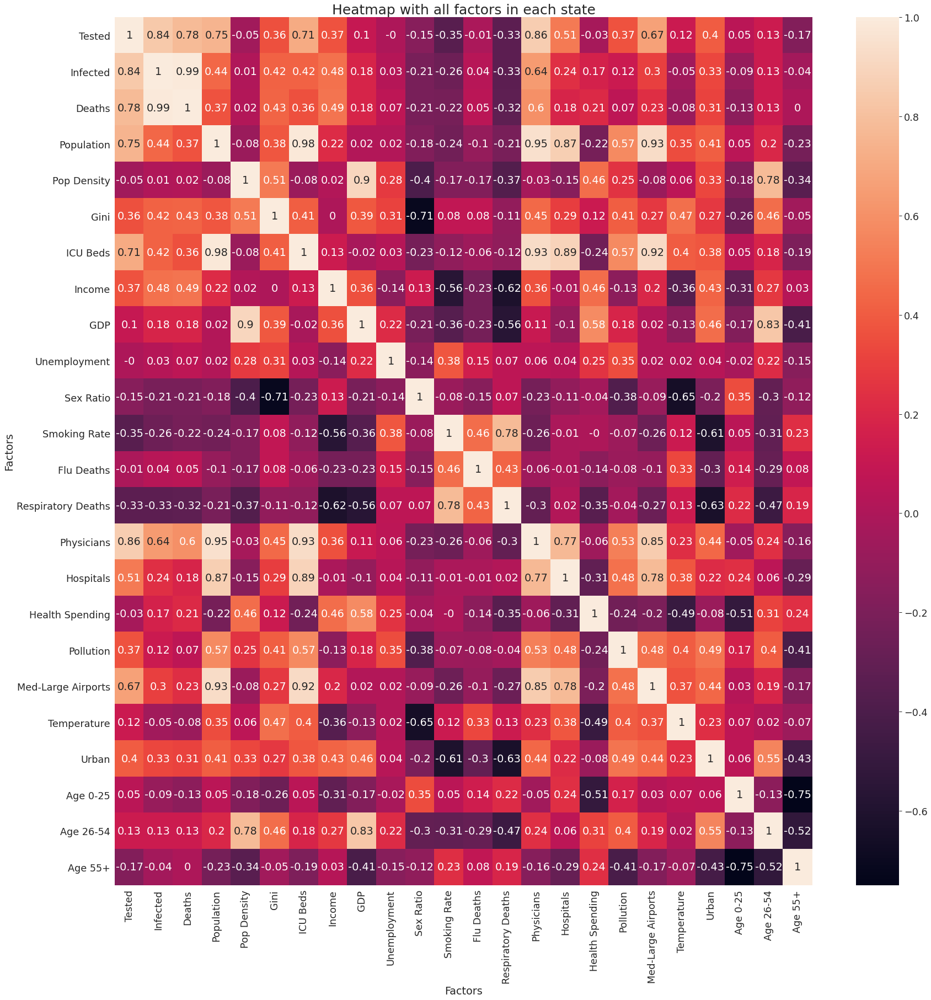

In [105]:
sql_statement = "select * from COVID19_state"
df = pd.read_sql_query(sql_statement, conn)

df = df.drop(columns=["PK"])

correlation_matrix = df.corr().round(2)
# annot = True to print the values inside the square
fig = plt.figure(figsize=(25,25))
ax = sns.heatmap(data=correlation_matrix, annot=True)
plt.tight_layout()

plt.xlabel("Factors");
plt.ylabel("Factors");

plt.title("Heatmap with all factors in each state", size=25);


**2-4-2 Use LinearRegression to deal with the data**

In [109]:
sql_statement = "select COVID19_state.'Age 0-25',COVID19_state.'Age 26-54',COVID19_state.'Age 55+',COVID19_state.'Infected',COVID19_state.'Tested',COVID19_state.'Income',COVID19_state.'Smoking Rate',COVID19_state.'Gini',COVID19_state.'Temperature' from COVID19_state"

df1 = pd.read_sql_query(sql_statement, conn)

min_max_scaler = preprocessing.MinMaxScaler()
x = df1.drop('Infected' , axis=1)
y = df1['Infected']
x_scaled = min_max_scaler.fit_transform(x)

lmodel = LinearRegression();
lmodel.fit(x_scaled,y);

In [110]:
lmodel.coef_

array([ 33476.73583363, -26042.02302052,  27528.58302947, 188169.887477  ,
        52290.91351297,  14535.59571378,  96472.52395996, -54765.09968515])

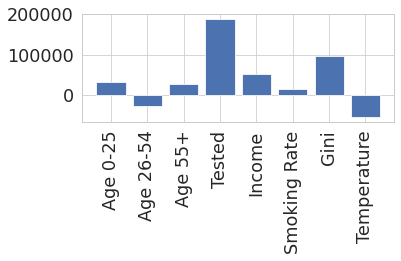

In [111]:
plt.bar(x.columns[:],lmodel.coef_)
plt.xticks(rotation='vertical')
plt.tight_layout()


In [115]:
sql_statement = "select COVID19_state.'Age 0-25',COVID19_state.'Deaths',COVID19_state.'Age 26-54',COVID19_state.'Age 55+',COVID19_state.'Gini',COVID19_state.'Physicians',COVID19_state.'Physicians' from COVID19_state"
#COVID19_state.'Age 0-25',COVID19_state.'Age 26-54',COVID19_state.'Gini',COVID19_state.'Age 55+',COVID19_state.'Infected',COVID19_state.'Deaths',COVID19_state.'Smoking Rate',COVID19_state.'Urban'
#x1 = execute_sql_statement(sql_statement3, conn)
df1 = pd.read_sql_query(sql_statement, conn)
#df = df1.drop('State', axis=1)
#df= df.drop('School Closure Date' , axis=1)
#df= df.drop('PK', axis = 1)
min_max_scaler = preprocessing.MinMaxScaler()
#df= df.drop('PK', axis = 1)
x = df1.drop('Deaths' , axis=1)
x_scaled = min_max_scaler.fit_transform(x)
y = df1['Deaths']
lmodel = LinearRegression();
lmodel.fit(x_scaled,y);


In [116]:
lmodel.coef_

array([-2152.69684243, -3232.74012933, -1050.95233389,  4441.76275784,
        4234.98109158,  4234.98109158])

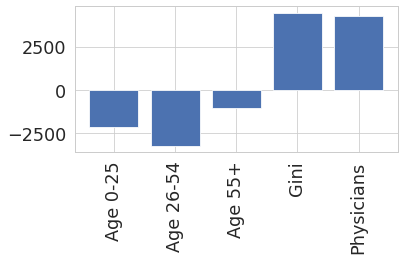

In [117]:
plt.bar(x.columns[:],lmodel.coef_)
plt.xticks(rotation='vertical')
plt.tight_layout()


In [ ]:
conn.close()

## 3. Summary

Our interactions regression plots such as the smoking rate, mortality rate, sex ratio tried to fit a regression model to display relationships, but for our project it wasn’t 100% clear which variables were best to use in our regression and which ones to exclude. Perhaps an alternative idea for our project would be to find a way to make use of principal components regression. Under principal component regression, which is essentially a dimensionality reduction technique for large datasets, we could choose the input variables that maximized the dispersion of the data. This just means the variables that had the highest variances would be the principal components and those principal components could summarize a large dataset in a concise manner. Principal components regression is a supervised learning technique that should be covered in EAS 506 or Statistical Data Mining I. We haven’t had that particular class yet, but if we had known the mathematical theory behind principal component regression and had more exposure to examples, it could’ve been a great tool for my implementation. Lots of analysis is being done on coronavirus in general; We think it’s very likely principal component regression is being used in some way for conducting research on the pandemic. It’s going to be interesting to see how others are conducting the research.
